In [2]:
import pymc as pm
import numpy as np
import pandas as pd
from scipy import stats
from sklearn import preprocessing
import matplotlib.pyplot as plt
import altair as alt
import xarray as xr
import graphviz as gv

alt.data_transformers.enable('default', max_rows = None)
import arviz as az
import warnings

warnings.filterwarnings('ignore')

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Get the data

In [3]:
foxes = pd.read_csv('foxes.csv', header = 0)
foxes.head()

,group,avgfood,groupsize,area,weight
0,1,0.37,2,1.09,5.02
1,1,0.37,2,1.09,2.84
2,2,0.53,2,2.05,5.33
3,2,0.53,2,2.05,6.07
4,3,0.49,2,2.12,5.85


1. use a model to infer the total causal influence of area on weight.

In [4]:
scale_cols = ['avgfood', 'groupsize', 'area', 'weight']
foxes[scale_cols] = preprocessing.scale(foxes[scale_cols])

foxes.head()

,group,avgfood,groupsize,area,weight
0,1,-1.933180,-1.530701,-2.249313,0.415931
1,1,-1.933180,-1.530701,-2.249313,-1.433238
2,2,-1.122886,-1.530701,-1.210738,0.678887
3,2,-1.122886,-1.530701,-1.210738,1.306586
4,3,-1.325459,-1.530701,-1.135008,1.119973


In [5]:
with pm.Model() as model_1:
    area = pm.Data('area', foxes['area'].values)
    weight = pm.Data('weight', foxes['weight'].values)
    
    alpha = pm.Normal('alpha', mu=0, sigma = 0.2)
    beta = pm.Normal('beta', mu = 0, sigma = 0.5)
    sigma = pm.Uniform('sigma', lower=0, upper = 2)
    
    mu = alpha + beta * area
    weight_hat = pm.Normal('weight_hat', mu=mu, sigma=sigma, observed=weight)
    

In [6]:
with model_1: 
    prior_1 = pm.sample_prior_predictive(samples = 40)
    post_1 = pm.sample()
    pred_1 = pm.sample_posterior_predictive(post_1)


Sampling: [alpha, beta, sigma, weight_hat]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 19 seconds.


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'beta'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

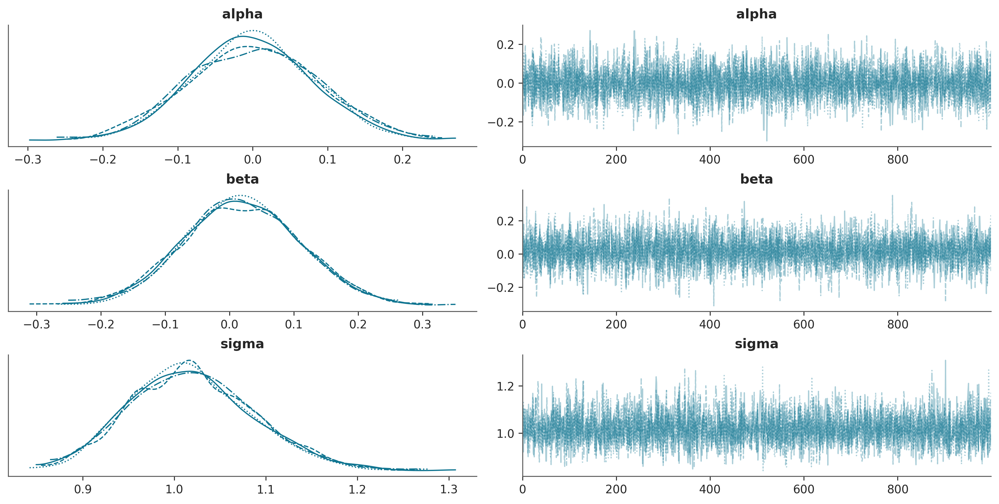

In [7]:
az.style.use('arviz-doc')
az.plot_trace(post_1)

array([<Axes: title={'center': 'alpha'}>,
       <Axes: title={'center': 'beta'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

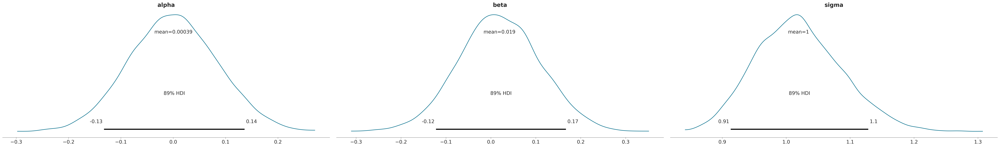

In [8]:
az.plot_posterior(post_1, hdi_prob=.89)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

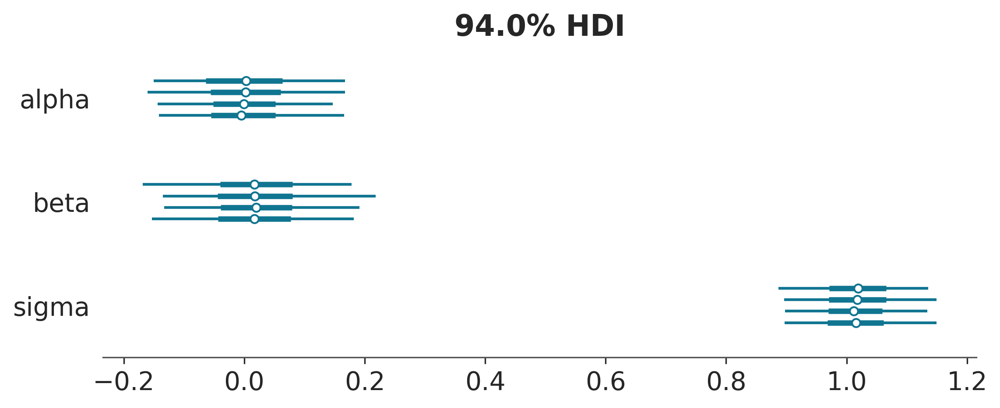

In [9]:
az.plot_forest(post_1, figsize=(7.5, 3))

In [10]:
az.summary(post_1).round(2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.00,0.08,-0.16,0.15,0.0,0.0,5558.0,3173.0,1.0
beta,0.02,0.09,-0.15,0.19,0.0,0.0,5906.0,3181.0,1.0
sigma,1.02,0.07,0.90,1.15,0.0,0.0,4801.0,2702.0,1.0


Text(0.5, 1.0, 'priors')

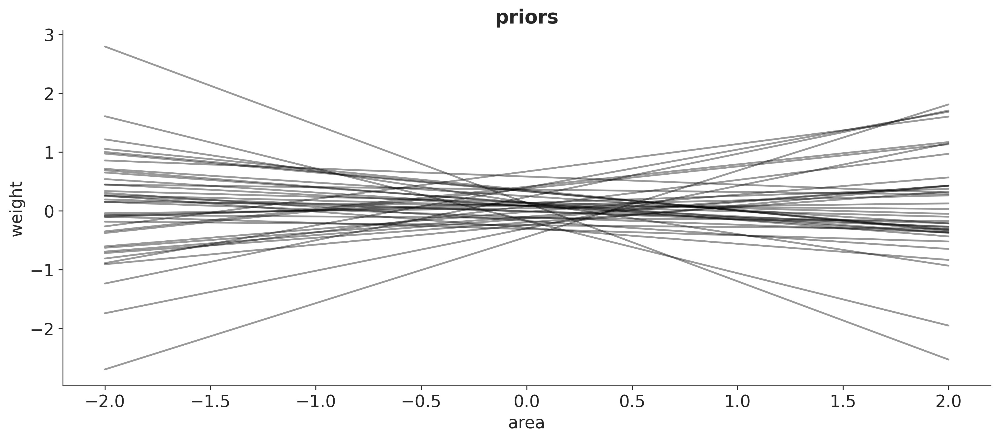

In [11]:
_, ax = plt.subplots()
x = xr.DataArray(np.linspace(-2, 2, 50), dims=['plot_dim'])
p = prior_1.prior
y = p['alpha'] + p['beta'] * x
ax.plot(x, y.stack(sample = ("chain", "draw")), c = "k", alpha = 0.4)
ax.set_xlabel("area")
ax.set_ylabel("weight")
ax.set_title("priors")

In [12]:
with model_1: 
    prior_1.extend(pm.sample(1000, tune = 1000))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


In [13]:
with model_1:
    pm.sample_posterior_predictive(prior_1, extend_inferencedata=True)

<Axes: xlabel='weight_hat / weight_hat'>

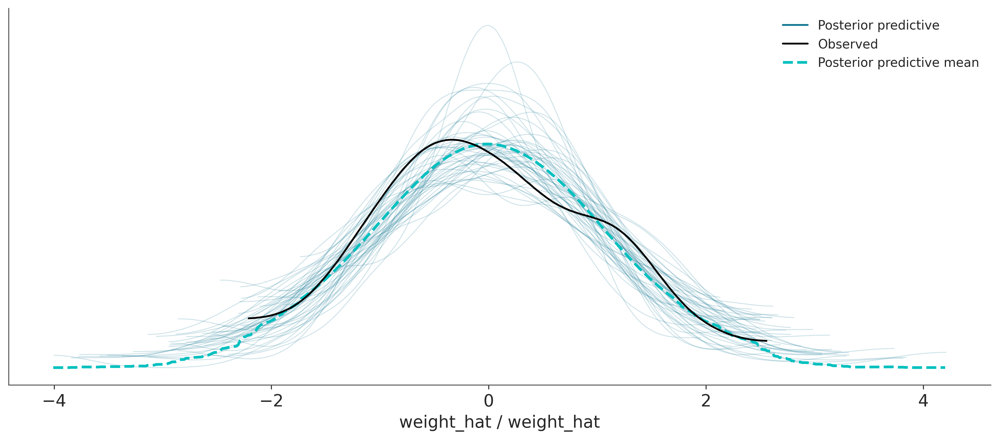

In [14]:
az.plot_ppc(prior_1, num_pp_samples=50)

array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'beta'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

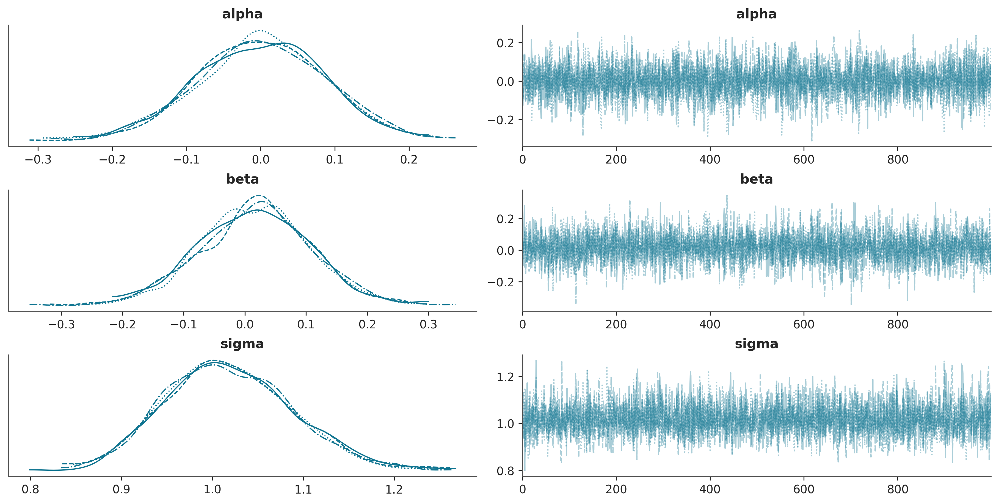

In [15]:
az.plot_trace(prior_1)

In [16]:
with pm.Model() as model_2: 
    w = pm.Data('weight', foxes['weight'].values)
    f = pm.Data('avgfood', foxes['avgfood'].values)
    g = pm.Data('groupsize', foxes['groupsize'].values)

    alpha = pm.Normal('alpha', mu=0, sigma = 0.2)
    beta_fw = pm.Normal('beta_fw', mu = 0, sigma = 0.5)
    beta_gw = pm.Normal('beta_gw', mu = 0, sigma = 0.5)
    sigma = pm.Uniform('sigma', lower=0, upper = 2)
    
    mu = alpha + beta_fw * f + beta_gw * g
    w_hat = pm.Normal('w_hat', mu=mu, sigma=sigma, observed=weight)

In [17]:
with model_2: 
    d2 = pm.sample_prior_predictive()
    d2.extend(pm.sample())
    pm.sample_posterior_predictive(d2)

Sampling: [alpha, beta_fw, beta_gw, sigma, w_hat]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_fw, beta_gw, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'beta_fw'}>,
        <Axes: title={'center': 'beta_fw'}>],
       [<Axes: title={'center': 'beta_gw'}>,
        <Axes: title={'center': 'beta_gw'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

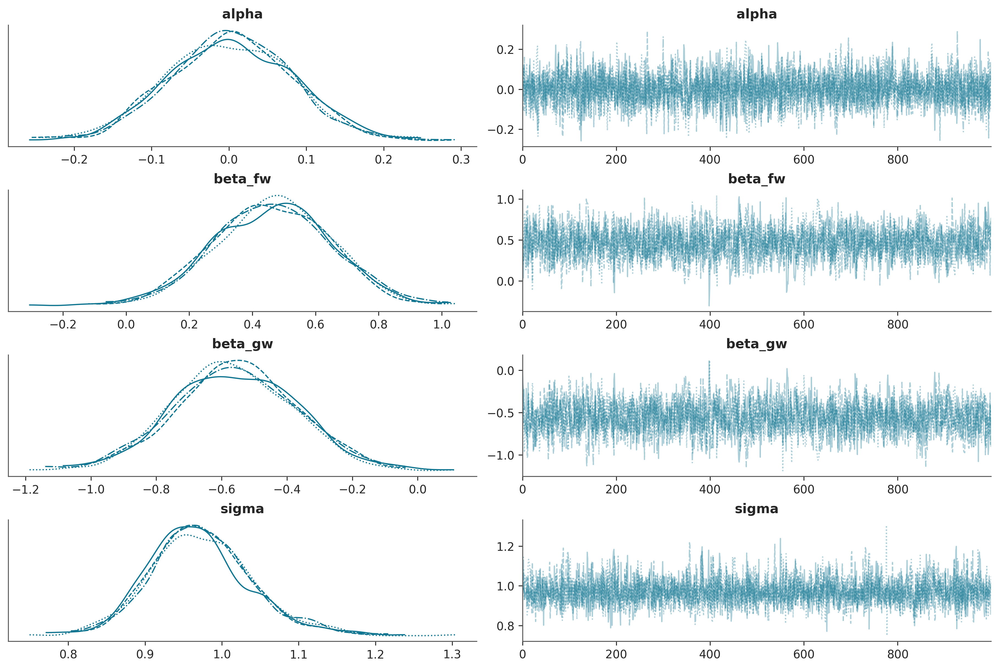

In [18]:
az.plot_trace(d2)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

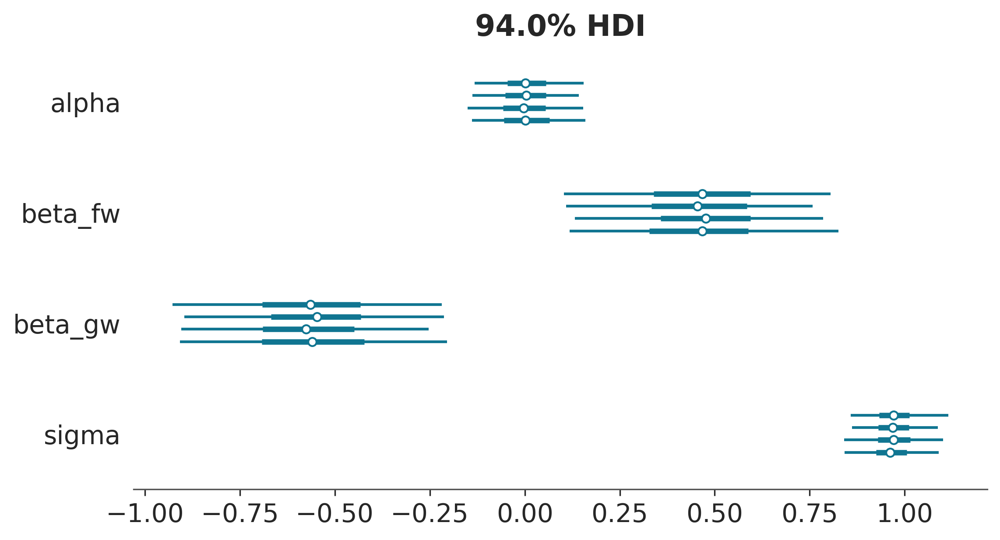

In [19]:
az.plot_forest(d2, figsize=[7.5, 4])

In [30]:
with pm.Model() as model_3: 
    f = pm.Data('avgfood', foxes['avgfood'].values)
    g = pm.Data('groupsize', foxes['groupsize'].values)
    
    alpha = pm.Normal('alpha', mu=0, sigma = 0.2)
    beta_fg = pm.Normal('beta_fg', mu = 0, sigma = 0.5)
    sigma = pm.Exponential('sigma', lam=1)
    
    g_mu = alpha + beta_fg * f 
    g_hat = pm.Normal('g_hat', mu = g_mu, sigma = sigma, observed = g)
    

In [31]:
with model_3: 
    d3 = pm.sample_prior_predictive()
    d3.extend(pm.sample())
    pm.sample_posterior_predictive(d3)

Sampling: [alpha, beta_fg, g_hat, sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta_fg, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'beta_fg'}>,
        <Axes: title={'center': 'beta_fg'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

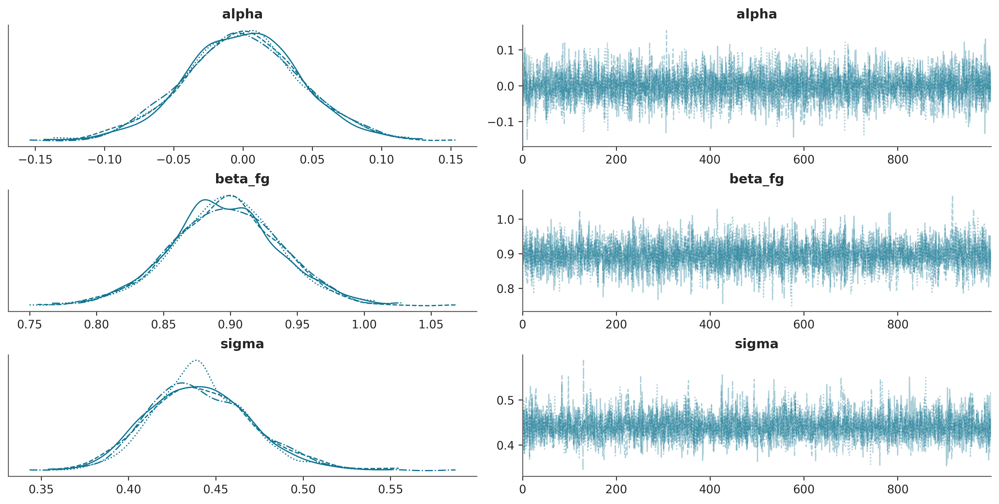

In [34]:
az.plot_trace(d3)

array([<Axes: >], dtype=object)

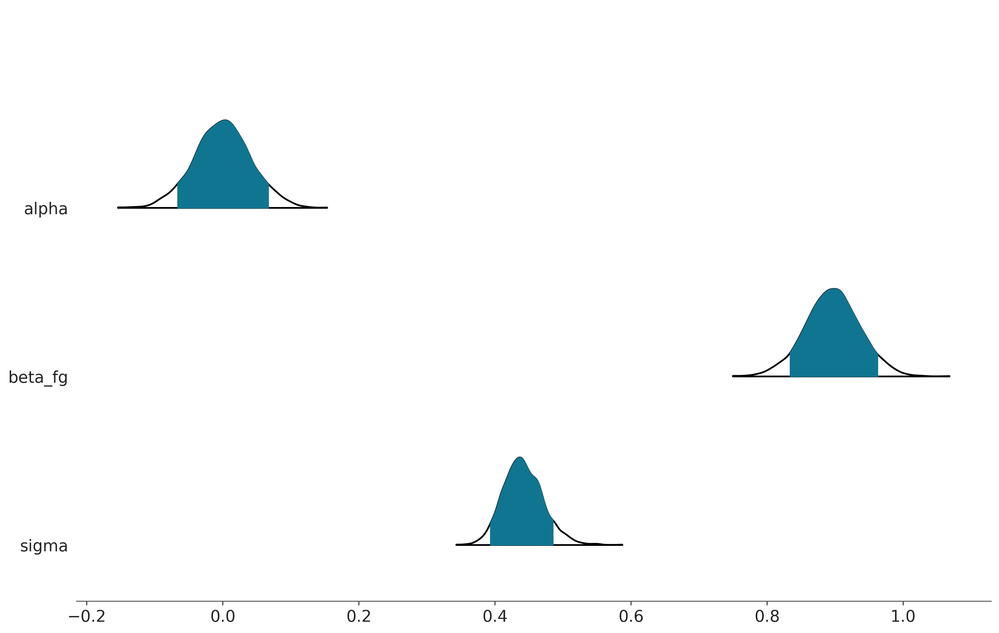

In [46]:
az.plot_forest(
    d3, 
    kind='ridgeplot', 
    combined=True,
    ridgeplot_truncate = False, 
    hdi_prob=.89,
    ridgeplot_overlap = 0.7
)

In [52]:
[print(col) for col in d3.to_dataframe()]
print(d3.to_dataframe().keys())

chain
draw
('posterior', 'alpha')
('posterior', 'beta_fg')
('posterior', 'sigma')
('sample_stats', 'step_size_bar')
('sample_stats', 'lp')
('sample_stats', 'energy')
('sample_stats', 'tree_depth')
('sample_stats', 'process_time_diff')
('sample_stats', 'diverging')
('sample_stats', 'reached_max_treedepth')
('sample_stats', 'index_in_trajectory')
('sample_stats', 'acceptance_rate')
('sample_stats', 'perf_counter_diff')
('sample_stats', 'largest_eigval')
('sample_stats', 'step_size')
('sample_stats', 'smallest_eigval')
('sample_stats', 'n_steps')
('sample_stats', 'perf_counter_start')
('sample_stats', 'energy_error')
('sample_stats', 'max_energy_error')
('prior', 'beta_fg')
('prior', 'sigma')
('prior', 'alpha')
('prior_predictive', 'g_hat[0]', 0)
('prior_predictive', 'g_hat[100]', 100)
('prior_predictive', 'g_hat[101]', 101)
('prior_predictive', 'g_hat[102]', 102)
('prior_predictive', 'g_hat[103]', 103)
('prior_predictive', 'g_hat[104]', 104)
('prior_predictive', 'g_hat[105]', 105)
('prio